In [2]:
import keras
from keras import layers
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
import pandas as pd
from pandas.plotting import register_matplotlib_converters
import os
import math
from sklearn.cluster import KMeans
from sklearn.metrics import precision_score
import seaborn as sns
from sklearn import metrics
import time
import pickle
import metric_learn
from sklearn.decomposition import PCA  
from sklearn import cluster, datasets, mixture
from sklearn.neighbors import LocalOutlierFactor
import functools
import tempfile
import datetime
import tensorflow as tf
import mlflow
from mlflow.models import infer_signature
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, losses
from tensorflow.keras.datasets import fashion_mnist
from tensorflow.keras.models import Model
from tensorflow.keras import layers
from tensorflow.keras import regularizers
from tensorflow.python.client import device_lib; print(device_lib.list_local_devices())
import tensorflow as tf
tf.config.list_physical_devices('GPU')
from utils import make_data, make_data_rev, make_label, calc_leq, leq_filter, validate, figure, figure_detail, plot_timeseries, fig_pr, auc_gs, fig_th_f

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 3745867805117692873
xla_global_id: -1
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 2710652928
locality {
  bus_id: 1
  links {
  }
}
incarnation: 884739266743775526
physical_device_desc: "device: 0, name: NVIDIA GeForce RTX 3080, pci bus id: 0000:01:00.0, compute capability: 8.6"
xla_global_id: 416903419
]


In [2]:
data_dir='filtered_csv_label'
original = pd.read_csv( os.path.join(data_dir, 'learning_data_10.csv') )
df = pd.read_csv( os.path.join(data_dir, 'learning_data_10.csv') )
df=df[df['day']<=9]
df

,original,label,time,day
0,53.4,0,15,0
1,52.8,0,15,0
2,52.8,0,15,0
3,53.2,0,15,0
4,53.6,0,15,0
...,...,...,...,...
3995345,45.9,0,5,9
3995346,45.6,0,5,9
3995347,45.8,0,5,9
3995348,45.7,0,5,9


In [3]:
test_day=[6, 7, 8, 9]
semi_train_day=[0, 1, 2, 3, 4, 5]

test_df=df[(df['day'].isin(test_day))].reset_index(drop=True)
semi_train_df=df[(df['day'].isin(semi_train_day))].reset_index(drop=True)

In [4]:
df_list=[]

window=15
for i in set(df['day']):
    lag=[] 
    lag.append(make_data(semi_train_df.loc[semi_train_df['day']==i, ['original']], 'original', window))
    lag.append(semi_train_df.loc[semi_train_df['day']==i, ['day']])
    lag.append(semi_train_df.loc[semi_train_df['day']==i, ['label']])
    df_add_lag=pd.concat(lag, axis=1)
    df_list.append(df_add_lag)
semi_train_df=pd.concat(df_list)
semi_train_df=semi_train_df.dropna().reset_index(drop=True)
semi_train_df.loc[:, 'vaed']=0
semi_train_df.loc[:, 'vaed_label']=0

In [5]:
semi_train_df

,original,original_lag1,original_lag2,original_lag3,original_lag4,original_lag5,original_lag6,original_lag7,original_lag8,original_lag9,original_lag10,original_lag11,original_lag12,original_lag13,original_lag14,day,label,vaed,vaed_label
0,54.9,55.0,55.7,55.8,55.6,55.7,55.5,55.7,54.7,54.0,53.6,53.2,52.8,52.8,53.4,0,0,0,0
1,54.9,54.9,55.0,55.7,55.8,55.6,55.7,55.5,55.7,54.7,54.0,53.6,53.2,52.8,52.8,0,0,0,0
2,54.9,54.9,54.9,55.0,55.7,55.8,55.6,55.7,55.5,55.7,54.7,54.0,53.6,53.2,52.8,0,0,0,0
3,55.0,54.9,54.9,54.9,55.0,55.7,55.8,55.6,55.7,55.5,55.7,54.7,54.0,53.6,53.2,0,0,0,0
4,55.0,55.0,54.9,54.9,54.9,55.0,55.7,55.8,55.6,55.7,55.5,55.7,54.7,54.0,53.6,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2393321,45.0,45.4,45.1,44.8,45.4,45.6,45.0,45.7,45.1,44.9,44.9,45.2,44.6,45.0,45.2,5,0,0,0
2393322,45.2,45.0,45.4,45.1,44.8,45.4,45.6,45.0,45.7,45.1,44.9,44.9,45.2,44.6,45.0,5,0,0,0
2393323,45.1,45.2,45.0,45.4,45.1,44.8,45.4,45.6,45.0,45.7,45.1,44.9,44.9,45.2,44.6,5,0,0,0
2393324,45.1,45.1,45.2,45.0,45.4,45.1,44.8,45.4,45.6,45.0,45.7,45.1,44.9,44.9,45.2,5,0,0,0


## VAE

In [8]:
intermediate_dim=10
latent_dim=4

class Sampling(layers.Layer):
    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon


class Encoder(layers.Layer):
    def __init__(self, latent_dim=32, intermediate_dim=64, name="encoder", **kwargs):
        super(Encoder, self).__init__(name=name, **kwargs)
        self.dense_proj = layers.Dense(intermediate_dim, activation="relu")
        self.dense_mean = layers.Dense(latent_dim)
        self.dense_log_var = layers.Dense(latent_dim)
        self.sampling = Sampling()

    def call(self, inputs):
        x = self.dense_proj(inputs)
        z_mean = self.dense_mean(x)
        z_log_var = self.dense_log_var(x)
        z = self.sampling((z_mean, z_log_var))
        return z_mean, z_log_var, z


class Decoder(layers.Layer):
    def __init__(self, original_dim, intermediate_dim=64, name="decoder", **kwargs):
        super(Decoder, self).__init__(name=name, **kwargs)
        self.dense_proj = layers.Dense(intermediate_dim, activation="relu")
        self.dense_output = layers.Dense(original_dim, activation="sigmoid")

    def call(self, inputs):
        x = self.dense_proj(inputs)
        return self.dense_output(x)


class VariationalAutoEncoder(keras.Model):
    def __init__(
        self,
        original_dim,
        intermediate_dim,
        latent_dim,
    ):
        super(VariationalAutoEncoder, self).__init__()
        self.original_dim = original_dim
        self.encoder = Encoder(latent_dim=latent_dim, intermediate_dim=intermediate_dim)
        self.decoder = Decoder(original_dim, intermediate_dim=intermediate_dim)

    def call(self, inputs):
        z_mean, z_log_var, z = self.encoder(inputs)
        reconstructed = self.decoder(z)
        # Add KL divergence regularization loss.
        kl_loss = -0.5 * tf.reduce_mean(
            z_log_var - tf.square(z_mean) - tf.exp(z_log_var) + 1
        )
        self.add_loss(kl_loss)
        return reconstructed

2023/12/31 21:12:28 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.
2023/12/31 21:12:28 INFO mlflow.tracking.fluent: Autologging successfully enabled for tensorflow.


訓練データ：[0, 2, 3, 4, 5]
ラベル付与データ：[1]日目


2023/12/31 21:12:29 WARNING mlflow.tensorflow: Encountered unexpected error while inferring batch size from training dataset: The layer "variational_auto_encoder_1" has never been called and thus has no defined input shape. Note that the `input_shape` property is only available for Functional and Sequential models.
2023/12/31 21:12:30 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "C:\Users\Arakawa\anaconda3\envs\tf291\lib\site-packages\mlflow\tensorflow\_autolog.py:52: UserWarning: This model has not yet been built. Build the model first by calling `build()` or by calling the model on a batch of data."


Epoch 1/20
4113/4113 [==============================] - 24s 6ms/step - loss: 0.1077 - val_loss: 0.1152
Epoch 2/20
4113/4113 [==============================] - 22s 5ms/step - loss: 0.0855 - val_loss: 0.1173
Epoch 3/20
4113/4113 [==============================] - 22s 5ms/step - loss: 0.0851 - val_loss: 0.1169
Epoch 4/20
4113/4113 [==============================] - 23s 6ms/step - loss: 0.0851 - val_loss: 0.1166
Epoch 5/20
4113/4113 [==============================] - 22s 5ms/step - loss: 0.0851 - val_loss: 0.1169
Epoch 6/20
4113/4113 [==============================] - 22s 5ms/step - loss: 0.0851 - val_loss: 0.1167
Epoch 7/20
4113/4113 [==============================] - 22s 5ms/step - loss: 0.0851 - val_loss: 0.1170
Epoch 8/20
4113/4113 [==============================] - 22s 5ms/step - loss: 0.0851 - val_loss: 0.1174
Epoch 9/20
4113/4113 [==============================] - 22s 5ms/step - loss: 0.0851 - val_loss: 0.1172
Epoch 10/20
4113/4113 [==============================] - 22s 5ms/step - l

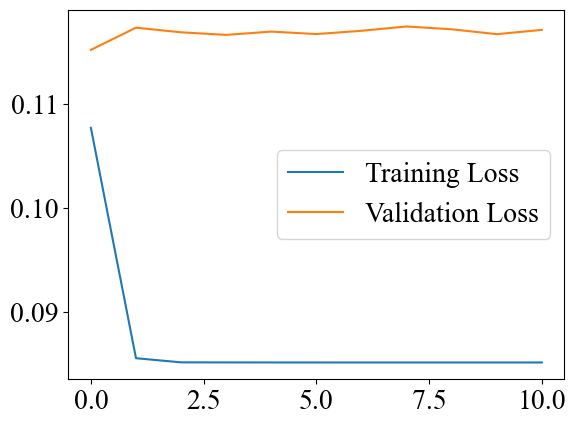

8984/8984 [==============================] - 11s 1ms/step
------------------------------------------------------


C:\Users\Arakawa\AppData\Local\Temp\ipykernel_14572\787243793.py:266: RuntimeWarning: invalid value encountered in true_divide
  f_score=(2*precision*recall)/(precision+recall)


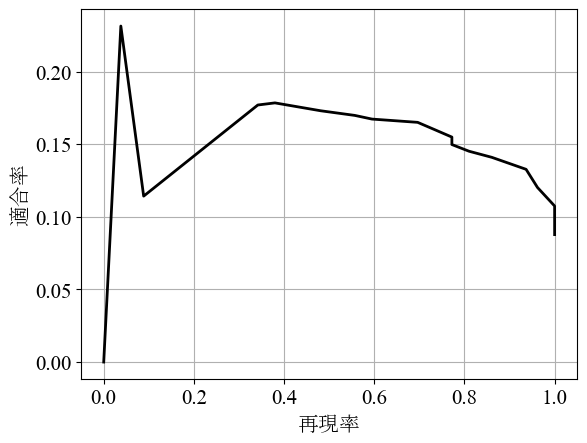

AUC：0.15370163904032766
理想の閾値：1.0
F値（最高）：nan
適合率（F値が最高の時）：0.0
再現率（F値が最高の時）：0.0
C:\Users\Arakawa\AppData\Local\Temp\tmp6c7fj05z\predict_results.png


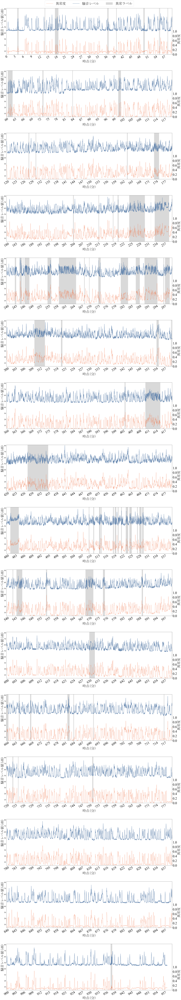

1/1 [==============================] - 0s 13ms/step


INFO:tensorflow:Assets written to: C:\Users\Arakawa\AppData\Local\Temp\tmp2wvn5rew\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\Arakawa\AppData\Local\Temp\tmp2wvn5rew\model\data\model\assets
C:\Users\Arakawa\anaconda3\envs\tf291\lib\site-packages\_distutils_hack\__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")
Registered model 'vae' already exists. Creating a new version of this model...
Created version '3' of model 'vae'.


In [9]:
# remote_server_uri = "http://localhost:5000"  # set to your server URI
# mlflow.set_tracking_uri(remote_server_uri)
mlflow.autolog(log_models=False)

# 実験をアクティブ化(設定)する。ない場合は新たな実験を作成してアクティブ化する
mlflow.set_experiment("mlflow_debug")
run_name='result'
with mlflow.start_run(run_name=run_name):

    # テストデータとする日
    i=[1]
    label_train_day=[k for k in semi_train_day if k not in i]
    label_grant_day=i
    print(f'訓練データ：{label_train_day}')
    print(f'ラベル付与データ：{label_grant_day}日目')
    # Log the hyperparameters
    mlflow.log_params({'trainday':label_train_day, 'testday':label_grant_day, 
                       'window_size':window, 'intermediate_dim':intermediate_dim, 'latent_dimension':latent_dim})
    
    semi_train_x=semi_train_df[(semi_train_df['day'].isin(label_train_day))][semi_train_df.columns[:-4]].reset_index(drop=True)
    labeling_x=semi_train_df[(semi_train_df['day'].isin(label_grant_day))][semi_train_df.columns[:-4]].reset_index(drop=True)
    # tf.reduce_min関数を使用して、train_dataテンソル内の最小値を計算しています。
    # min_valにはtrain_data内の最小値が代入されます。
    min_val = tf.reduce_min(semi_train_x)
    # tf.reduce_max関数を使用して、train_dataテンソル内の最大値を計算しています。
    # max_valにはtrain_data内の最大値が代入されます。
    max_val = tf.reduce_max(semi_train_x)
    train_data = (semi_train_x - min_val) / (max_val - min_val)
    labeling_data = (labeling_x - min_val) / (max_val - min_val)
    # データの型をtf.float32に変換
    train_data = tf.cast(train_data, tf.float32)
    
    labeling_data = tf.cast(labeling_data, tf.float32)
    
    vae = VariationalAutoEncoder(original_dim=window,
                                 intermediate_dim=intermediate_dim,
                                 latent_dim=latent_dim)
    
    vae.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), 
                             loss='mae')
    
    callback = tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',
        min_delta=0,
        patience=10,
        restore_best_weights=True
    )
    log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
    
    history = vae.fit(train_data, train_data, 
          epochs=20, 
          batch_size=512,
          validation_data=(labeling_data, labeling_data),
          callbacks=[callback, tensorboard_callback],
          shuffle=True)
    
    plt.plot(history.history["loss"], label="Training Loss")
    plt.plot(history.history["val_loss"], label="Validation Loss")
    plt.legend()
    plt.show()

    reconstructions = vae.predict(labeling_data)
    #     異常度算出
    d= tf.keras.losses.mae(reconstructions, labeling_data).numpy()
    semi_train_df.loc[semi_train_df['day'].isin(label_grant_day), 'vaed']=d
    print('------------------------------------------------------')

    test_v=semi_train_df.loc[semi_train_df['day'].isin(label_grant_day), ['original', 'label']].copy().reset_index(drop=True)
    d_test=(d-d.min())/(d.max()-d.min())

    thr_bins=20
    p_score, r_score, f_score, thresholds, thr, auc = fig_pr(test_v, d_test, thr_bins)
    f_max=f_score.max()
    p_max=p_score[np.argmax(f_score)]
    r_max=r_score[np.argmax(f_score)]
    print('\033[31m'+f'AUC：{auc}'+'\033[0m')
    print(f'理想の閾値：{thr}')
    print(f'F値（最高）：{f_max}')
    print(f'適合率（F値が最高の時）：{p_max}')
    print(f'再現率（F値が最高の時）：{r_max}')
    
    # Log the loss metric
    mlflow.log_metric("test_AUC", auc)
    mlflow.log_metric("test_Fscore_best", f_max)
    mlflow.log_metric("test_Precision_when Fscore Best", p_max)
    mlflow.log_metric("test_Recall_when Fscore Best", r_max)
    
    # 一時ディレクトリに予測結果のグラフを保存して，mlflowに送信する
    with tempfile.TemporaryDirectory()  as tmp:
        filename = os.path.join(tmp, "predict_results.png")
        plot_timeseries([test_v['original'].values], test_v['label'].values, d=d_test, thr=thr, mlflow=filename)
        mlflow.log_artifact(filename, artifact_path="plot_timeseries")
    
#     モデルの構造を定義しているソースコードを保存
    mlflow.log_artifact('VAE_HO.ipynb', artifact_path="source_code")    
    # Log the model
    signature= infer_signature(labeling_data.numpy()[:2], vae.predict(labeling_data.numpy()[:2]))
    input_example= labeling_data.numpy()[:2]
    mlflow.tensorflow.log_model(
        vae, 
        artifact_path="vae",
        signature=signature,
        registered_model_name="vae",
        input_example= input_example
    )